In [ ]:
import nltk
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re
import string
from sklearn.model_selection import train_test_split
import seaborn as sns
import os

In [ ]:
ds  = pd.read_excel("/content/drive/MyDrive/clean_complete_translated_telugu_news.xlsx")
ds

,SNo,date,heading,body,topic,heading_en,body_en
0,414,11-05-2017 00:39:13,ఐడిబిఐపై ఆర్బిఐ నజర్,భారీ ఎత్తున మొండిబకాయిలు పెరిగిపోవడంతో ఐడిబిఐ ...,business,RBI Nazar on IDBI,The Reserve Bank of India (RBI) has taken a cl...
1,2668,12-06-2017 00:40:32,బ్యాంకింగ్ చీఫ్లతో నేడు జైట్లీ భేటీ,న్యూఢిల్లీ : ఆర్థిక మంత్రి అరుణ్ జైట్లీ సోమవార...,business,Jaitley met banking chiefs today,New Delhi: Finance Minister Arun Jaitley will ...
2,19923,19-01-2017 19:51:31,కీలక వికెట్ తీసిన జడేజా..,కటక్: ఇంగ్లండ్తో జరుగుతున్న సెకండ్ వన్డే మ్యాచ...,sports,Jadeja took the key wicket..,Cuttack: In the second ODI match against Engla...
3,15762,23-11-2017 17:29:04,మరో రెచ్చగొట్టే చర్యకు దిగిన పాకిస్థాన్,ఇస్లామాబాద్ : పాకిస్థాన్ అంతర్జాతీయ ఉగ్రవాది హ...,nation,Pakistan has taken another provocative action,Islamabad: Pakistan released international ter...
4,8624,03-04-2017 15:48:23,గోవాలో కొడుకుతో కలిసి అల్లు అర్జున్ స్విమ్మింగ్!,స్టార్ హీరోగా వరుస సినిమాలతో బిజీగా ఉన్నప్పటిక...,entertainment,Allu Arjun swimming with his son in Goa!,Despite being busy with a series of films as a...
...,...,...,...,...,...,...,...
21636,4093,18-11-2017 01:17:03,వర్గ హత్యలు ఆగాలి!,మొన్న త్రిసూరులో పట్టపగలు ఆరెస్సెస్ కార్యకర్త ...,editorial,Class killings must stop!,The killing of an RSS worker in broad daylight...
21637,13874,22-03-2017 19:02:03,'ఫేస్బుక్'పై నిషేధం..?,ఇస్లామాబాద్: దైవదూషణకు సంబంధించిన సమాచారానికి ...,nation,Ban on 'Facebook'?,"Islamabad: Pakistan plans to ban 'Facebook', w..."
21638,15364,15-06-2017 03:18:08,అమెరికా చట్టసభ్యుడిపై కాల్పులు,"ఒక రిపబ్లికన్ సభ్యుడు, నలుగురు అధికారులకు గాయా...",nation,US lawmaker shot,"A Republican member, four officers injuredAlex..."
21639,17166,18-05-2017 19:22:27,కోటి రూపాయల.. రద్దైన పాత కరెన్సీ స్వాధీనం,"థానే: కోటి రూపాయల విలువైన రద్దైన పాత రూ.1000, ...",nation,Crore rupees.. Seizure of canceled old currency,Thane: Police have seized bundles of canceled ...


In [ ]:
!pip install langdetect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from langdetect import detect
def lang_identify(str_element):
  a = str(str_element)
  return detect(str_element)
ds['lang']=ds['body_en'].apply(lang_identify)
ds=ds[ds['lang']=='en']
ds

,SNo,date,heading,body,topic,heading_en,body_en,lang
0,414,11-05-2017 00:39:13,ఐడిబిఐపై ఆర్బిఐ నజర్,భారీ ఎత్తున మొండిబకాయిలు పెరిగిపోవడంతో ఐడిబిఐ ...,business,RBI Nazar on IDBI,The Reserve Bank of India (RBI) has taken a cl...,en
1,2668,12-06-2017 00:40:32,బ్యాంకింగ్ చీఫ్లతో నేడు జైట్లీ భేటీ,న్యూఢిల్లీ : ఆర్థిక మంత్రి అరుణ్ జైట్లీ సోమవార...,business,Jaitley met banking chiefs today,New Delhi: Finance Minister Arun Jaitley will ...,en
2,19923,19-01-2017 19:51:31,కీలక వికెట్ తీసిన జడేజా..,కటక్: ఇంగ్లండ్తో జరుగుతున్న సెకండ్ వన్డే మ్యాచ...,sports,Jadeja took the key wicket..,Cuttack: In the second ODI match against Engla...,en
3,15762,23-11-2017 17:29:04,మరో రెచ్చగొట్టే చర్యకు దిగిన పాకిస్థాన్,ఇస్లామాబాద్ : పాకిస్థాన్ అంతర్జాతీయ ఉగ్రవాది హ...,nation,Pakistan has taken another provocative action,Islamabad: Pakistan released international ter...,en
4,8624,03-04-2017 15:48:23,గోవాలో కొడుకుతో కలిసి అల్లు అర్జున్ స్విమ్మింగ్!,స్టార్ హీరోగా వరుస సినిమాలతో బిజీగా ఉన్నప్పటిక...,entertainment,Allu Arjun swimming with his son in Goa!,Despite being busy with a series of films as a...,en
...,...,...,...,...,...,...,...,...
21635,1346,02-06-2017 01:07:03,రష్యాతో కలిసి స్వతంత్ర పరపతి రేటింగ్ వ్యవస్థ,"మూడీస్, ఎస్ అండ్ పిలకు చెక్ పెట్టే యోచనమాస్కో:...",business,Independent credit rating system with Russia,"Moody's, S&P plan to check Moscow: India-Russi...",en
21636,4093,18-11-2017 01:17:03,వర్గ హత్యలు ఆగాలి!,మొన్న త్రిసూరులో పట్టపగలు ఆరెస్సెస్ కార్యకర్త ...,editorial,Class killings must stop!,The killing of an RSS worker in broad daylight...,en
21637,13874,22-03-2017 19:02:03,'ఫేస్బుక్'పై నిషేధం..?,ఇస్లామాబాద్: దైవదూషణకు సంబంధించిన సమాచారానికి ...,nation,Ban on 'Facebook'?,"Islamabad: Pakistan plans to ban 'Facebook', w...",en
21638,15364,15-06-2017 03:18:08,అమెరికా చట్టసభ్యుడిపై కాల్పులు,"ఒక రిపబ్లికన్ సభ్యుడు, నలుగురు అధికారులకు గాయా...",nation,US lawmaker shot,"A Republican member, four officers injuredAlex...",en


In [ ]:
ds

,SNo,date,heading,body,topic,heading_en,body_en,lang
0,414,11-05-2017 00:39:13,ఐడిబిఐపై ఆర్బిఐ నజర్,భారీ ఎత్తున మొండిబకాయిలు పెరిగిపోవడంతో ఐడిబిఐ ...,business,RBI Nazar on IDBI,The Reserve Bank of India (RBI) has taken a cl...,en
1,2668,12-06-2017 00:40:32,బ్యాంకింగ్ చీఫ్లతో నేడు జైట్లీ భేటీ,న్యూఢిల్లీ : ఆర్థిక మంత్రి అరుణ్ జైట్లీ సోమవార...,business,Jaitley met banking chiefs today,New Delhi: Finance Minister Arun Jaitley will ...,en
2,19923,19-01-2017 19:51:31,కీలక వికెట్ తీసిన జడేజా..,కటక్: ఇంగ్లండ్తో జరుగుతున్న సెకండ్ వన్డే మ్యాచ...,sports,Jadeja took the key wicket..,Cuttack: In the second ODI match against Engla...,en
3,15762,23-11-2017 17:29:04,మరో రెచ్చగొట్టే చర్యకు దిగిన పాకిస్థాన్,ఇస్లామాబాద్ : పాకిస్థాన్ అంతర్జాతీయ ఉగ్రవాది హ...,nation,Pakistan has taken another provocative action,Islamabad: Pakistan released international ter...,en
4,8624,03-04-2017 15:48:23,గోవాలో కొడుకుతో కలిసి అల్లు అర్జున్ స్విమ్మింగ్!,స్టార్ హీరోగా వరుస సినిమాలతో బిజీగా ఉన్నప్పటిక...,entertainment,Allu Arjun swimming with his son in Goa!,Despite being busy with a series of films as a...,en
...,...,...,...,...,...,...,...,...
21635,1346,02-06-2017 01:07:03,రష్యాతో కలిసి స్వతంత్ర పరపతి రేటింగ్ వ్యవస్థ,"మూడీస్, ఎస్ అండ్ పిలకు చెక్ పెట్టే యోచనమాస్కో:...",business,Independent credit rating system with Russia,"Moody's, S&P plan to check Moscow: India-Russi...",en
21636,4093,18-11-2017 01:17:03,వర్గ హత్యలు ఆగాలి!,మొన్న త్రిసూరులో పట్టపగలు ఆరెస్సెస్ కార్యకర్త ...,editorial,Class killings must stop!,The killing of an RSS worker in broad daylight...,en
21637,13874,22-03-2017 19:02:03,'ఫేస్బుక్'పై నిషేధం..?,ఇస్లామాబాద్: దైవదూషణకు సంబంధించిన సమాచారానికి ...,nation,Ban on 'Facebook'?,"Islamabad: Pakistan plans to ban 'Facebook', w...",en
21638,15364,15-06-2017 03:18:08,అమెరికా చట్టసభ్యుడిపై కాల్పులు,"ఒక రిపబ్లికన్ సభ్యుడు, నలుగురు అధికారులకు గాయా...",nation,US lawmaker shot,"A Republican member, four officers injuredAlex...",en


In [ ]:
import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
nltk.download('punkt')
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.stem.porter import *
stemmer = PorterStemmer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
ds.isna().sum()

SNo           0
date          0
heading       1
body          0
topic         0
heading_en    1
body_en       0
lang          0
dtype: int64

In [ ]:
topic_dic = {}
c = 0
for un in ds["topic"].unique():
    if un not in topic_dic:
        topic_dic[un] = c
        c += 1     
topic_dic

{'business': 0, 'sports': 1, 'nation': 2, 'entertainment': 3, 'editorial': 4}

In [ ]:
inv_topic_dict = {v: k for k, v in topic_dic.items()}

In [ ]:
def func_topic(s):
    return topic_dic[s]
ds["topic"] = ds["topic"].apply(func_topic)

<ipython-input-86-a089587578a8>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds["topic"] = ds["topic"].apply(func_topic)


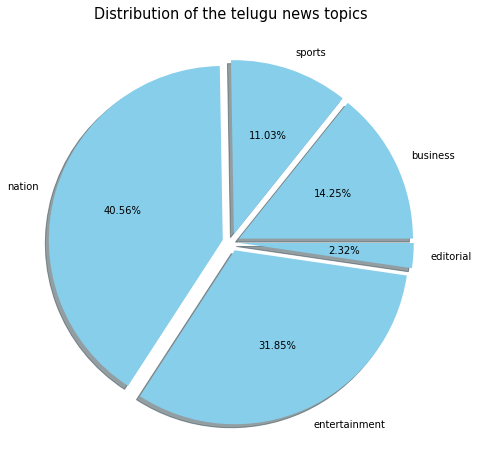

In [ ]:
def get_count(df):
    
    unvals = list(df.unique())
    op = [0]*len(unvals)
    
    i = 0
    for un in unvals:
        op[i] = df[df == un].shape[0]
        i += 1
        
    return [list(unvals),op]

cont = get_count(ds["topic"])
clables = cont[0]
labels = []
for c in clables:
    labels.append(inv_topic_dict[c])

plt.figure(figsize=(10,8))
plt.title("Distribution of the telugu news topics", fontsize = 14.5)
# plt.style.use('seaborn-colorblind')
colors=['skyblue']
plt.pie(np.array(cont[1]), labels=labels, autopct='%1.2f%%', shadow=True, colors = colors,explode = (0.05, 0.05, 0.05, 0.05,0.05))
plt.show()

In [ ]:
!pip install indic-nlp-library


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!git clone https://github.com/anoopkunchukuttan/indic_nlp_resources.git

fatal: destination path 'indic_nlp_resources' already exists and is not an empty directory.


In [ ]:
!git clone https://github.com/anoopkunchukuttan/indic_nlp_library.git

fatal: destination path 'indic_nlp_library' already exists and is not an empty directory.


In [ ]:
import sys
from indicnlp import common
# The path to the local git repo for Indic NLP library
INDIC_NLP_LIB_HOME=r"indic_nlp_library"
# The path to the local git repo for Indic NLP Resources
INDIC_NLP_RESOURCES=r"indic_nlp_resources"
# Add library to Python path
sys.path.append(r'{}\src'.format(INDIC_NLP_LIB_HOME))
# Set environment variable for resources folder
common.set_resources_path(INDIC_NLP_RESOURCES)

In [ ]:
#preprocess function 
stem_words=lambda x: stemmer.stem(x)
break_into_words = lambda x : re.findall("[a-zA-Z0-9]+", x)
skip_stop_words = lambda x: [w for w in x if w not in list(stop_words)]
skip_numeric = lambda x : [w for w in x if not w.isnumeric()]

In [ ]:
import nltk
nltk.download('omw-1.4')
def remove_tags(text):
  remove = re.compile(r'')
  return re.sub(remove, '', text)
ds['body_en'] = ds['body_en'].apply(remove_tags)

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
<ipython-input-93-ce19a7019baa>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds['body_en'] = ds['body_en'].apply(remove_tags)


In [ ]:
def special_char(text):
  reviews = ''
  for x in text:
    if x.isalnum():
      reviews = reviews + x
    else:
      reviews = reviews + ' '
  return reviews
ds['body_en'] = ds['body_en'].apply(special_char)

<ipython-input-94-8c29341e7ee8>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds['body_en'] = ds['body_en'].apply(special_char)


In [ ]:
def convert_lower(text):
   return text.lower()
ds['body_en'] = ds['body_en'].apply(convert_lower)
ds['body_en'][1]

<ipython-input-95-84ba63dd8318>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds['body_en'] = ds['body_en'].apply(convert_lower)


'new delhi  finance minister arun jaitley will meet the heads of public sector banks  psbs  on monday  it is expected that the main discussion will be on the collection of non performing loans  npas   which have become a stumbling block for psbs  in this meeting which will be held almost throughout the day  furthermore  the performance of psbs  the situation of stressed loans and the measures taken by banks to clean up their balance sheets will also come up for discussion  this is jaitley s first meeting with psb chiefs this financial year  the meeting gained more importance after the passing of an ordinance amending the banking regulation act of 1949 for collection of bad debts  this ordinance empowers rbi to direct banks to take action for recovery of npas  also  in this meeting there is a possibility to review the pradhan mantri jeevan jyoti bima yojana  pradhan mantri suraksha bima yojana and atal pension yojana schemes  it is noteworthy that before this meeting  jaitley said that 

In [ ]:
def remove_stopwords(text):
  stop_words = set(stopwords.words('english'))
  words = word_tokenize(text)
  return [x for x in words if x not in stop_words]
ds['body_en'] = ds['body_en'].apply(remove_stopwords)
ds['body_en'][1]

<ipython-input-96-10fb8fc79a8c>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds['body_en'] = ds['body_en'].apply(remove_stopwords)


['new',
 'delhi',
 'finance',
 'minister',
 'arun',
 'jaitley',
 'meet',
 'heads',
 'public',
 'sector',
 'banks',
 'psbs',
 'monday',
 'expected',
 'main',
 'discussion',
 'collection',
 'non',
 'performing',
 'loans',
 'npas',
 'become',
 'stumbling',
 'block',
 'psbs',
 'meeting',
 'held',
 'almost',
 'throughout',
 'day',
 'furthermore',
 'performance',
 'psbs',
 'situation',
 'stressed',
 'loans',
 'measures',
 'taken',
 'banks',
 'clean',
 'balance',
 'sheets',
 'also',
 'come',
 'discussion',
 'jaitley',
 'first',
 'meeting',
 'psb',
 'chiefs',
 'financial',
 'year',
 'meeting',
 'gained',
 'importance',
 'passing',
 'ordinance',
 'amending',
 'banking',
 'regulation',
 'act',
 '1949',
 'collection',
 'bad',
 'debts',
 'ordinance',
 'empowers',
 'rbi',
 'direct',
 'banks',
 'take',
 'action',
 'recovery',
 'npas',
 'also',
 'meeting',
 'possibility',
 'review',
 'pradhan',
 'mantri',
 'jeevan',
 'jyoti',
 'bima',
 'yojana',
 'pradhan',
 'mantri',
 'suraksha',
 'bima',
 'yojana',

In [ ]:
def lemmatize_word(text):
  wordnet = WordNetLemmatizer()
  return " ".join([wordnet.lemmatize(word) for word in text])
ds['body_en'] = ds['body_en'].apply(lemmatize_word)
ds['body_en'][1]

<ipython-input-97-90722c2604fc>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds['body_en'] = ds['body_en'].apply(lemmatize_word)


'new delhi finance minister arun jaitley meet head public sector bank psbs monday expected main discussion collection non performing loan npa become stumbling block psbs meeting held almost throughout day furthermore performance psbs situation stressed loan measure taken bank clean balance sheet also come discussion jaitley first meeting psb chief financial year meeting gained importance passing ordinance amending banking regulation act 1949 collection bad debt ordinance empowers rbi direct bank take action recovery npa also meeting possibility review pradhan mantri jeevan jyoti bima yojana pradhan mantri suraksha bima yojana atal pension yojana scheme noteworthy meeting jaitley said discussion setting universal minimum income ubi bad bank going'

In [ ]:
from indicnlp.tokenize import sentence_tokenize

indic_string = ds["body_en"][0]
# Split the sentence, language code "hi" is passed for hindi
sentences=sentence_tokenize.sentence_split(indic_string, lang='en')

# print the sentences
for t in sentences:
    print(t)

reserve bank india rbi taken close look affair idbi due huge increase bad debt known idbi bank included rbi watchlist net non performing loan exceeding 6 percent reporting loss two consecutive year capital adequacy falling prescribed norm case bank placed rbi watch list idbi disclosed rbi taken prompt corrective action pca regarding bank past rbi also undertaken pca relation overseas bank united bank idbi explained pca burden bank financially improve internal control improve operation accordance rbi directive idbi focus using capital sparingly part take step like imposing restriction leverage stopping appointment setting aside new investment scheme bank respond properly prepared merge another strong bank


In [ ]:
ds["body_processed"] = ds["body_en"].str.replace('\u200c', '')
ds["body_processed"] = ds["body_processed"].str.replace('\n', '')
ds["body_processed"] = ds["body_processed"].str.replace('\t', '')
ds["body_processed"] = ds["body_processed"].str.replace('\xa0', '')

<ipython-input-99-842a25f06bf5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds["body_processed"] = ds["body_en"].str.replace('\u200c', '')
<ipython-input-99-842a25f06bf5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds["body_processed"] = ds["body_processed"].str.replace('\n', '')
<ipython-input-99-842a25f06bf5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

In [ ]:
PUNCT = string.punctuation

def remove_punctuation(text):
    return text.translate(str.maketrans('', '', PUNCT))

In [ ]:
from indicnlp.tokenize import sentence_tokenize
tot_telugu_text1 = ""
for t in ds["body_processed"]:
  tot_telugu_text1 += t
# tot_sentances_telugu = []
tot_sentences = sentence_tokenize.sentence_split(tot_telugu_text1, lang='en')
print(len(tot_sentences))

1


In [ ]:
ds["body_processed"] = ds["body_processed"].apply(lambda text: remove_punctuation(text))

<ipython-input-102-765c0b0d82c5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ds["body_processed"] = ds["body_processed"].apply(lambda text: remove_punctuation(text))


In [ ]:
tot_telugu_text = ""
c = 1
for t in ds["body_processed"]:
  tot_telugu_text += t
  c += 1

print(c)

18891


In [ ]:
len(tot_telugu_text)

11783867

In [ ]:
from indicnlp.tokenize import indic_tokenize  

vocab_dic  = {}
tokenized_text = []
heap_arr = []

for t in indic_tokenize.trivial_tokenize(tot_telugu_text):
    tokenized_text.append(t)
    heap_arr.append(len(vocab_dic))

    if t not in vocab_dic:
      vocab_dic[t] = 1

    else:
      vocab_dic[t] += 1

In [ ]:
len(vocab_dic), len(tokenized_text)

(66805, 1679166)

In [ ]:
len(heap_arr)

1679166

In [ ]:
from nltk.probability import FreqDist 

freq_dist = FreqDist(vocab_dic)

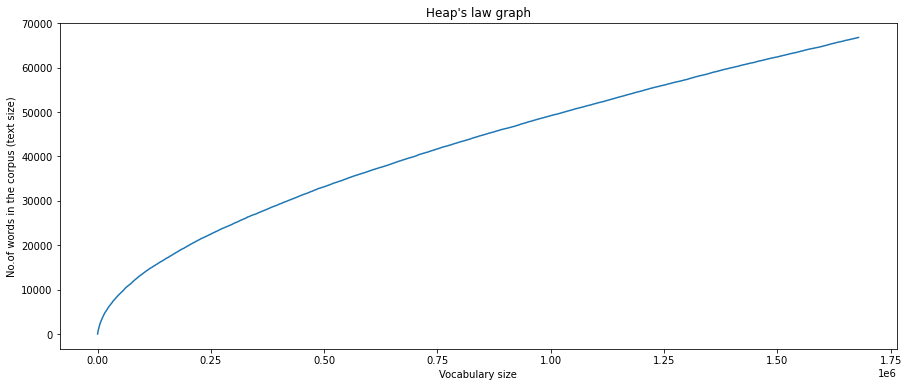

In [ ]:
plt.figure(figsize = (15,6))
plt.plot(heap_arr)
plt.title("Heap's law graph")
plt.xlabel("Vocabulary size")
plt.ylabel("No.of words in the corpus (text size)")
plt.show()

In [ ]:
vocab_dic_sorted = {k: v for k, v in sorted(vocab_dic.items(), key=lambda item: item[1], reverse = True)}

In [ ]:
top_k_words = []

k = 50
c = 0

for key in vocab_dic_sorted.keys():

  if c == k:
    break

  top_k_words.append([key, vocab_dic_sorted[key]])
  c += 1

In [ ]:
top_k_words_df = pd.DataFrame(top_k_words)
top_k_words_df.columns = ["word", "freq"]
top_k_words_df.head()

,word,freq
0,said,21604
1,film,15889
2,movie,12219
3,also,9061
4,year,7380


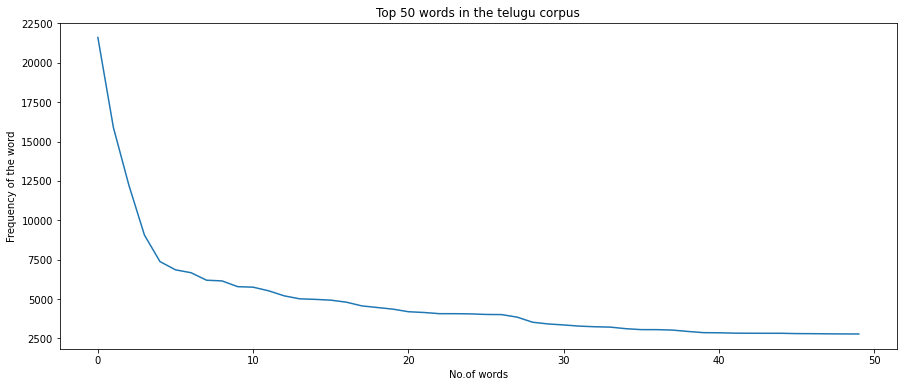

In [ ]:
plt.figure(figsize = (15,6))
plt.plot(top_k_words_df["freq"])
plt.title("Top 50 words in the telugu corpus")
plt.xlabel("No.of words")
plt.ylabel("Frequency of the word")
# plt.xlim([0,k])
plt.show()

In [ ]:
telugu_words = list(vocab_dic_sorted.keys())

In [ ]:
tot_sentences_proc = []

for sen in tot_sentences:
  tot_sentences_proc.append(remove_punctuation(sen))

In [ ]:
tot_sentences_proc[0]

'reserve bank india rbi taken close look affair idbi due huge increase bad debt known idbi bank included rbi watchlist net non performing loan exceeding 6 percent reporting loss two consecutive year capital adequacy falling prescribed norm case bank placed rbi watch list idbi disclosed rbi taken prompt corrective action pca regarding bank past rbi also undertaken pca relation overseas bank united bank idbi explained pca burden bank financially improve internal control improve operation accordance rbi directive idbi focus using capital sparingly part take step like imposing restriction leverage stopping appointment setting aside new investment scheme bank respond properly prepared merge another strong banknew delhi finance minister arun jaitley meet head public sector bank psbs monday expected main discussion collection non performing loan npa become stumbling block psbs meeting held almost throughout day furthermore performance psbs situation stressed loan measure taken bank clean bala

In [ ]:
from nltk.util import ngrams
bigrams_telugu_vocab = {}
for sen in tot_sentences_proc:
  tokens = indic_tokenize.trivial_tokenize(sen)
  bigram = list(ngrams(tokens, 2)) 
  for big in bigram:
    if tuple(big) not in bigrams_telugu_vocab:
      bigrams_telugu_vocab[tuple(big)] = 1
    else:
      bigrams_telugu_vocab[tuple(big)] += 1

In [ ]:
bigrams_telugu_vocab = {k: v for k, v in sorted(bigrams_telugu_vocab.items(), key=lambda item: item[1], reverse = True)}

In [ ]:
print("Total no.of unique bi-grams :- ", len(bigrams_telugu_vocab))

Total no.of unique bi-grams :-  888682


In [ ]:
k = 10
print("Top" ,k ,"most-occuring bi-grams in the corpus are\n")
c = 0
for key in bigrams_telugu_vocab:
  if c == k:
    break
  print(key , " -> ", bigrams_telugu_vocab[key])
  c += 1

Top 10 most-occuring bi-grams in the corpus are

('prime', 'minister')  ->  2235
('chief', 'minister')  ->  1518
('andhra', 'jyoti')  ->  1504
('supreme', 'court')  ->  1213
('new', 'delhi')  ->  1147
('social', 'medium')  ->  1101
('tamil', 'nadu')  ->  944
('last', 'year')  ->  882
('high', 'court')  ->  798
('first', 'time')  ->  767


In [ ]:
trigrams_telugu_vocab = {}

for sen in tot_sentences_proc:
  tokens = indic_tokenize.trivial_tokenize(sen)
  trigram = list(ngrams(tokens, 3)) 

  for trig in trigram:
    if tuple(trig) not in trigrams_telugu_vocab:
      trigrams_telugu_vocab[tuple(trig)] = 1

    else:
      trigrams_telugu_vocab[tuple(trig)] += 1

trigrams_telugu_vocab = {k: v for k, v in sorted(trigrams_telugu_vocab.items(), key=lambda item: item[1], reverse = True)}

In [ ]:
k = 10
print("Top" ,k ,"most-occuring tri-grams in the corpus are\n")
c = 0
for key in trigrams_telugu_vocab:
  if c == k:
    break
  print(key , " -> ", trigrams_telugu_vocab[key])
  c += 1

Top 10 most-occuring tri-grams in the corpus are

('prime', 'minister', 'modi')  ->  601
('minister', 'narendra', 'modi')  ->  548
('prime', 'minister', 'narendra')  ->  540
('andhra', 'jyoti', 'business')  ->  395
('incident', 'took', 'place')  ->  307
('president', 'rahul', 'gandhi')  ->  224
('vice', 'president', 'rahul')  ->  217
('minister', 'arun', 'jaitley')  ->  207
('congress', 'vice', 'president')  ->  185
('finance', 'minister', 'arun')  ->  163


In [ ]:
print("Total no.of unique tri-grams :- ", len(trigrams_telugu_vocab))

Total no.of unique tri-grams :-  1463643


In [ ]:
four_grams_telugu_vocab = {}

for sen in tot_sentences_proc:
  tokens = indic_tokenize.trivial_tokenize(sen)
  fourgram = list(ngrams(tokens, 4)) 

  for fourg in fourgram:
    if tuple(fourg) not in four_grams_telugu_vocab:
      four_grams_telugu_vocab[tuple(fourg)] = 1

    else:
      four_grams_telugu_vocab[tuple(fourg)] += 1

four_grams_telugu_vocab = {k: v for k, v in sorted(four_grams_telugu_vocab.items(), key=lambda item: item[1], reverse = True)}

In [ ]:
k = 10
print("Top" ,k ,"most-occuring 4-grams in the corpus are\n")
c = 0
for key in four_grams_telugu_vocab:
  if c == k:
    break
  print(key , " -> ", four_grams_telugu_vocab[key])
  c += 1

Top 10 most-occuring 4-grams in the corpus are

('prime', 'minister', 'narendra', 'modi')  ->  539
('vice', 'president', 'rahul', 'gandhi')  ->  208
('congress', 'vice', 'president', 'rahul')  ->  181
('finance', 'minister', 'arun', 'jaitley')  ->  162
('u', 'president', 'donald', 'trump')  ->  141
('hyderabad', 'andhra', 'jyoti', 'business')  ->  113
('chief', 'minister', 'yogi', 'adityanath')  ->  99
('home', 'minister', 'rajnath', 'singh')  ->  97
('union', 'finance', 'minister', 'arun')  ->  96
('intraday', 'trading', 'short', 'position')  ->  93


In [ ]:
print("Total no.of unique 4-grams :- ", len(four_grams_telugu_vocab))

Total no.of unique 4-grams :-  1606384


In [ ]:
five_grams_telugu_vocab = {}

for sen in tot_sentences_proc:
  tokens = indic_tokenize.trivial_tokenize(sen)
  fivegram = list(ngrams(tokens, 5)) 

  for fiveg in fivegram:
    if tuple(fiveg) not in five_grams_telugu_vocab:
      five_grams_telugu_vocab[tuple(fiveg)] = 1

    else:
      five_grams_telugu_vocab[tuple(fiveg)] += 1

five_grams_telugu_vocab = {k: v for k, v in sorted(five_grams_telugu_vocab.items(), key=lambda item: item[1], reverse = True)}

In [ ]:
k = 10
print("Top" ,k ,"most-occuring 5-grams in the corpus are\n")
c = 0
for key in five_grams_telugu_vocab:
  if c == k:
    break
  print(key , " -> ", five_grams_telugu_vocab[key])
  c += 1

Top 10 most-occuring 5-grams in the corpus are

('congress', 'vice', 'president', 'rahul', 'gandhi')  ->  175
('union', 'finance', 'minister', 'arun', 'jaitley')  ->  96
('level', 'crucial', 'intraday', 'trading', 'short')  ->  92
('crucial', 'intraday', 'trading', 'short', 'position')  ->  92
('external', 'affair', 'minister', 'sushma', 'swaraj')  ->  89
('opening', 'level', 'crucial', 'intraday', 'trading')  ->  85
('delhi', 'prime', 'minister', 'narendra', 'modi')  ->  84
('union', 'home', 'minister', 'rajnath', 'singh')  ->  78
('nifty', 'future', 'trading', 'opening', 'level')  ->  72
('trading', 'strategy', 'nifty', 'future', 'trading')  ->  68


In [ ]:
print("Total no.of unique 5-grams :- ", len(five_grams_telugu_vocab))

Total no.of unique 5-grams :-  1643722


In [ ]:
ngrams_count = []

ngrams_count.append(len(vocab_dic_sorted))
ngrams_count.append(len(bigrams_telugu_vocab))
ngrams_count.append(len(trigrams_telugu_vocab))
ngrams_count.append(len(four_grams_telugu_vocab))
ngrams_count.append(len(five_grams_telugu_vocab))

In [ ]:
ngrams_count

[66805, 888682, 1463643, 1606384, 1643722]

Text(0, 0.5, 'No.of unique n-grams')

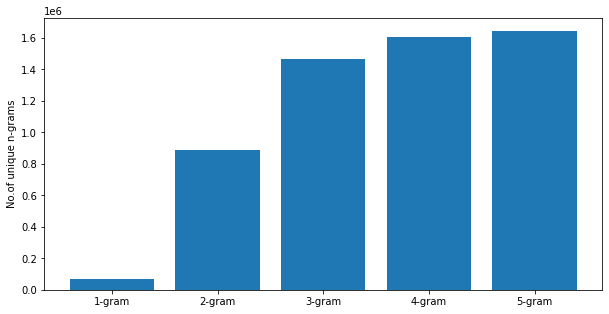

In [ ]:
plt.figure(figsize = (10,5))
plt.bar(x = ["1-gram","2-gram","3-gram","4-gram","5-gram"], height = ngrams_count)
plt.ylabel("No.of unique n-grams")

In [ ]:
ds["topic"].unique()

array([0, 1, 2, 3, 4])

In [ ]:
from indicnlp.tokenize import sentence_tokenize


# function to build a n-gram vocabulary
def build_n_gram_vocab(n, tot_sentences_proc):

  if n > 1:
    n_grams_telugu_vocab = {}

    for sen in tot_sentences_proc:
      tokens = indic_tokenize.trivial_tokenize(sen)
      ngram = list(ngrams(tokens, n))
      for ngm in ngram:
        if tuple(ngm) not in n_grams_telugu_vocab:
          n_grams_telugu_vocab[tuple(ngm)] = 1

        else:
          n_grams_telugu_vocab[tuple(ngm)] += 1

    n_grams_telugu_vocab = {k: v for k, v in sorted(n_grams_telugu_vocab.items(), key=lambda item: item[1], reverse = True)}


  else:
    n_grams_telugu_vocab = {}

    for sen in tot_sentences_proc:
      tokens = indic_tokenize.trivial_tokenize(sen)
      ngram = list(ngrams(tokens, 1)) 

      for ngm in ngram:
        if ngm not in n_grams_telugu_vocab:
          n_grams_telugu_vocab[ngm] = 1

        else:
          n_grams_telugu_vocab[ngm] += 1

    n_grams_telugu_vocab = {k: v for k, v in sorted(n_grams_telugu_vocab.items(), key=lambda item: item[1], reverse = True)}

  return n_grams_telugu_vocab

# function to get the vocabulary of the text of a class specified
def get_class_vocab(class_id, n_grams = 1):
  tot_text_class = ""

  for t in ds[ds["topic"] == class_id]["body_processed"]:
    tot_text_class += t

  tot_sentances_class = sentence_tokenize.sentence_split(tot_text_class, lang='en')

  vocab = build_n_gram_vocab(n_grams, tot_sentances_class)
    
  return vocab

In [ ]:
def get_prob_class_ngram(input_text, vocab, n_grams, class_id, laplace_param = 1):
  total_tokens = len(vocab)
  Prob_input = 1

  tokens = indic_tokenize.trivial_tokenize(input_text)

  vocab_n_1 = get_class_vocab(class_id, n_grams-1)
  
  if n_grams > 1:
    ngram = list(ngrams(tokens, n_grams))
    for ngm in ngram:

      prior_ngm = tuple(ngm[:n_grams-1])
      if prior_ngm in vocab_n_1:
        count_denom = vocab_n_1[prior_ngm]
      else:
        count_denom = 1

      if tuple(ngm) in vocab:
        count_w = vocab[tuple(ngm)]
      else:
        count_w = 0
      Prob_input *= ((count_w + laplace_param)/(count_denom+(laplace_param*len(vocab_n_1))))

  else:
    tokens = indic_tokenize.trivial_tokenize(sen)
    ngram = list(ngrams(tokens, 1))

    for ngm in ngram:
      if ngm in vocab:
        count_w = vocab[ngm]
      else:
        count_w = 0

      prob = count_w/total_tokens
      Prob_input *= count_w/total_tokens

  return Prob_input

def get_max_ind(arr):

  n = len(arr)

  max_ind = 0
  max_prob = arr[0]

  for i in range(1,n):

    if arr[i] > max_prob:
      max_ind = i
      max_prob = arr[i]

  return max_ind, max_prob


# Function to classify the given input text using the n_grams model
def classify_text(text, n_grams, laplace_param = 0):

  cls0_vocab = get_class_vocab(0, n_grams)
  cls1_vocab = get_class_vocab(1, n_grams)
  cls2_vocab = get_class_vocab(2, n_grams)
  cls3_vocab = get_class_vocab(3, n_grams)
  cls4_vocab = get_class_vocab(4, n_grams)

  probs_arr = []

  cls0_prob = get_prob_class_ngram(text, cls0_vocab, n_grams,0, laplace_param)
  cls1_prob = get_prob_class_ngram(text, cls1_vocab, n_grams,1, laplace_param)
  cls2_prob = get_prob_class_ngram(text, cls2_vocab, n_grams,2, laplace_param)
  cls3_prob = get_prob_class_ngram(text, cls3_vocab, n_grams,3, laplace_param)
  cls4_prob = get_prob_class_ngram(text, cls4_vocab, n_grams,4, laplace_param)

  probs_arr.append(cls0_prob)
  probs_arr.append(cls1_prob)
  probs_arr.append(cls2_prob)
  probs_arr.append(cls3_prob)
  probs_arr.append(cls4_prob)

#   We select the class with max probability as the final output
  print(probs_arr)
  class_pred, prob_cls = get_max_ind(probs_arr)

  return class_pred, prob_cls

In [ ]:
test_news_df = pd.read_excel("/content/drive/MyDrive/clean_complete_translated_telugu_news.xlsx")
from langdetect import detect
def lang_identify(str_element):
  a = str(str_element)
  return detect(str_element)
test_news_df['lang']=test_news_df['body_en'].apply(lang_identify)
test_news_df=test_news_df[test_news_df['lang']=='en']
test_news_df
del test_news_df['heading']
del test_news_df['heading_en']
del test_news_df['date']

In [ ]:
test_news_df

,SNo,body,topic,body_en,lang
0,414,భారీ ఎత్తున మొండిబకాయిలు పెరిగిపోవడంతో ఐడిబిఐ ...,business,The Reserve Bank of India (RBI) has taken a cl...,en
1,2668,న్యూఢిల్లీ : ఆర్థిక మంత్రి అరుణ్ జైట్లీ సోమవార...,business,New Delhi: Finance Minister Arun Jaitley will ...,en
2,19923,కటక్: ఇంగ్లండ్తో జరుగుతున్న సెకండ్ వన్డే మ్యాచ...,sports,Cuttack: In the second ODI match against Engla...,en
3,15762,ఇస్లామాబాద్ : పాకిస్థాన్ అంతర్జాతీయ ఉగ్రవాది హ...,nation,Islamabad: Pakistan released international ter...,en
4,8624,స్టార్ హీరోగా వరుస సినిమాలతో బిజీగా ఉన్నప్పటిక...,entertainment,Despite being busy with a series of films as a...,en
...,...,...,...,...,...
21635,1346,"మూడీస్, ఎస్ అండ్ పిలకు చెక్ పెట్టే యోచనమాస్కో:...",business,"Moody's, S&P plan to check Moscow: India-Russi...",en
21636,4093,మొన్న త్రిసూరులో పట్టపగలు ఆరెస్సెస్ కార్యకర్త ...,editorial,The killing of an RSS worker in broad daylight...,en
21637,13874,ఇస్లామాబాద్: దైవదూషణకు సంబంధించిన సమాచారానికి ...,nation,"Islamabad: Pakistan plans to ban 'Facebook', w...",en
21638,15364,"ఒక రిపబ్లికన్ సభ్యుడు, నలుగురు అధికారులకు గాయా...",nation,"A Republican member, four officers injuredAlex...",en


In [ ]:
y_test = test_news_df["topic"].apply(func_topic)
# del test_news_df["topic"]
test_news_df

,SNo,body,topic,body_en,lang
0,414,భారీ ఎత్తున మొండిబకాయిలు పెరిగిపోవడంతో ఐడిబిఐ ...,business,The Reserve Bank of India (RBI) has taken a cl...,en
1,2668,న్యూఢిల్లీ : ఆర్థిక మంత్రి అరుణ్ జైట్లీ సోమవార...,business,New Delhi: Finance Minister Arun Jaitley will ...,en
2,19923,కటక్: ఇంగ్లండ్తో జరుగుతున్న సెకండ్ వన్డే మ్యాచ...,sports,Cuttack: In the second ODI match against Engla...,en
3,15762,ఇస్లామాబాద్ : పాకిస్థాన్ అంతర్జాతీయ ఉగ్రవాది హ...,nation,Islamabad: Pakistan released international ter...,en
4,8624,స్టార్ హీరోగా వరుస సినిమాలతో బిజీగా ఉన్నప్పటిక...,entertainment,Despite being busy with a series of films as a...,en
...,...,...,...,...,...
21635,1346,"మూడీస్, ఎస్ అండ్ పిలకు చెక్ పెట్టే యోచనమాస్కో:...",business,"Moody's, S&P plan to check Moscow: India-Russi...",en
21636,4093,మొన్న త్రిసూరులో పట్టపగలు ఆరెస్సెస్ కార్యకర్త ...,editorial,The killing of an RSS worker in broad daylight...,en
21637,13874,ఇస్లామాబాద్: దైవదూషణకు సంబంధించిన సమాచారానికి ...,nation,"Islamabad: Pakistan plans to ban 'Facebook', w...",en
21638,15364,"ఒక రిపబ్లికన్ సభ్యుడు, నలుగురు అధికారులకు గాయా...",nation,"A Republican member, four officers injuredAlex...",en


In [ ]:
import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
from nltk.tokenize import word_tokenize
from nltk.tokenize import sent_tokenize
nltk.download('punkt')
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.stem.porter import *
stemmer = PorterStemmer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
#preprocess function 
stem_words=lambda x: stemmer.stem(x)
break_into_words = lambda x : re.findall("[a-zA-Z0-9]+", x)
skip_stop_words = lambda x: [w for w in x if w not in list(stop_words)]
skip_numeric = lambda x : [w for w in x if not w.isnumeric()]

In [ ]:
import nltk
nltk.download('omw-1.4')
def remove_tags(text):
  remove = re.compile(r'')
  return re.sub(remove, '', text)
test_news_df['body_en'] = test_news_df['body_en'].apply(remove_tags)

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


In [ ]:
def special_char(text):
  reviews = ''
  for x in text:
    if x.isalnum():
      reviews = reviews + x
    else:
      reviews = reviews + ' '
  return reviews
test_news_df['body_en'] = test_news_df['body_en'].apply(special_char)

In [ ]:
def convert_lower(text):
   return text.lower()
test_news_df['body_en'] = test_news_df['body_en'].apply(convert_lower)
test_news_df['body_en'][1]

'new delhi  finance minister arun jaitley will meet the heads of public sector banks  psbs  on monday  it is expected that the main discussion will be on the collection of non performing loans  npas   which have become a stumbling block for psbs  in this meeting which will be held almost throughout the day  furthermore  the performance of psbs  the situation of stressed loans and the measures taken by banks to clean up their balance sheets will also come up for discussion  this is jaitley s first meeting with psb chiefs this financial year  the meeting gained more importance after the passing of an ordinance amending the banking regulation act of 1949 for collection of bad debts  this ordinance empowers rbi to direct banks to take action for recovery of npas  also  in this meeting there is a possibility to review the pradhan mantri jeevan jyoti bima yojana  pradhan mantri suraksha bima yojana and atal pension yojana schemes  it is noteworthy that before this meeting  jaitley said that 

In [ ]:
def remove_stopwords(text):
  stop_words = set(stopwords.words('english'))
  words = word_tokenize(text)
  return [x for x in words if x not in stop_words]
test_news_df['body_en'] = test_news_df['body_en'].apply(remove_stopwords)
test_news_df['body_en'][1]

['new',
 'delhi',
 'finance',
 'minister',
 'arun',
 'jaitley',
 'meet',
 'heads',
 'public',
 'sector',
 'banks',
 'psbs',
 'monday',
 'expected',
 'main',
 'discussion',
 'collection',
 'non',
 'performing',
 'loans',
 'npas',
 'become',
 'stumbling',
 'block',
 'psbs',
 'meeting',
 'held',
 'almost',
 'throughout',
 'day',
 'furthermore',
 'performance',
 'psbs',
 'situation',
 'stressed',
 'loans',
 'measures',
 'taken',
 'banks',
 'clean',
 'balance',
 'sheets',
 'also',
 'come',
 'discussion',
 'jaitley',
 'first',
 'meeting',
 'psb',
 'chiefs',
 'financial',
 'year',
 'meeting',
 'gained',
 'importance',
 'passing',
 'ordinance',
 'amending',
 'banking',
 'regulation',
 'act',
 '1949',
 'collection',
 'bad',
 'debts',
 'ordinance',
 'empowers',
 'rbi',
 'direct',
 'banks',
 'take',
 'action',
 'recovery',
 'npas',
 'also',
 'meeting',
 'possibility',
 'review',
 'pradhan',
 'mantri',
 'jeevan',
 'jyoti',
 'bima',
 'yojana',
 'pradhan',
 'mantri',
 'suraksha',
 'bima',
 'yojana',

In [ ]:
def lemmatize_word(text):
  wordnet = WordNetLemmatizer()
  return " ".join([wordnet.lemmatize(word) for word in text])
test_news_df['body_en'] = test_news_df['body_en'].apply(lemmatize_word)
test_news_df['body_en'][1]

'new delhi finance minister arun jaitley meet head public sector bank psbs monday expected main discussion collection non performing loan npa become stumbling block psbs meeting held almost throughout day furthermore performance psbs situation stressed loan measure taken bank clean balance sheet also come discussion jaitley first meeting psb chief financial year meeting gained importance passing ordinance amending banking regulation act 1949 collection bad debt ordinance empowers rbi direct bank take action recovery npa also meeting possibility review pradhan mantri jeevan jyoti bima yojana pradhan mantri suraksha bima yojana atal pension yojana scheme noteworthy meeting jaitley said discussion setting universal minimum income ubi bad bank going'

In [ ]:
test_news_df["body_processed"] = test_news_df["body_en"].str.replace('\u200c', '')
test_news_df["body_processed"] = test_news_df["body_processed"].str.replace('\n', '')
test_news_df["body_processed"] = test_news_df["body_processed"].str.replace('\t', '')
test_news_df["body_processed"] = test_news_df["body_processed"].str.replace('\xa0', '')

test_news_df["body_processed"] = test_news_df["body_processed"].apply(lambda text: remove_punctuation(text))

# del test_news_df["body_en"]

In [ ]:
test_news_df.head()

,SNo,body,topic,body_en,lang,body_processed
0,414,భారీ ఎత్తున మొండిబకాయిలు పెరిగిపోవడంతో ఐడిబిఐ ...,business,reserve bank india rbi taken close look affair...,en,reserve bank india rbi taken close look affair...
1,2668,న్యూఢిల్లీ : ఆర్థిక మంత్రి అరుణ్ జైట్లీ సోమవార...,business,new delhi finance minister arun jaitley meet h...,en,new delhi finance minister arun jaitley meet h...
2,19923,కటక్: ఇంగ్లండ్తో జరుగుతున్న సెకండ్ వన్డే మ్యాచ...,sports,cuttack second odi match england indian team l...,en,cuttack second odi match england indian team l...
3,15762,ఇస్లామాబాద్ : పాకిస్థాన్ అంతర్జాతీయ ఉగ్రవాది హ...,nation,islamabad pakistan released international terr...,en,islamabad pakistan released international terr...
4,8624,స్టార్ హీరోగా వరుస సినిమాలతో బిజీగా ఉన్నప్పటిక...,entertainment,despite busy series film star hero today film ...,en,despite busy series film star hero today film ...


In [ ]:
categories = [i for i in range(5)]

test_text = []
for t in test_news_df["body_processed"]:
  test_text.append(t)

In [ ]:
x_test = test_text

print(len(x_test) , len(y_test))

18891 18891


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

In [ ]:
categories = [i for i in range(5)]

text_topic = []
for i in range(5):
  curr_text = ""

  for text in ds[ds["topic"] == i]["body_processed"]:
    curr_text += text
    curr_text += " "
    
  text_topic.append(curr_text)

In [ ]:
len(text_topic)

for i in range(5):
  print(len(text_topic[i]))

1819863
1154968
4802636
3755458
269832


In [ ]:
from indicnlp.tokenize import indic_tokenize  


def get_all_vocab(tot_text):
  dic = {}
  for t in indic_tokenize.trivial_tokenize(tot_text): 
    if t not in dic:
      dic[t] = 1
    else:
      dic[t] += 1

  return dic 
  
tot_text = ""
for i in range(5):
  tot_text += text_topic[i]

In [ ]:
tot_vocab = get_all_vocab(tot_text)
tot_vocab = {k: v for k, v in sorted(tot_vocab.items(), key=lambda item: item[1], reverse = True)}

print(len(tot_vocab))

51025


In [ ]:
x_train = text_topic
y_train = categories

In [ ]:
import regex 
from indicnlp.tokenize import indic_tokenize
def custom_analyzer(text):
    words = regex.findall(r'\w{1,}', text) #extract words of at least 2 letters
    for w in words:
        yield w

In [ ]:
count_vec = CountVectorizer(max_df = 0.75,min_df=0.1, lowercase = False , analyzer = custom_analyzer, ngram_range=(1,2))
x_train_features = count_vec.fit_transform(x_train)

In [ ]:
x_train_features.shape

(5, 45136)

In [ ]:
# Stop words identified from the corpus by using the term-frequencies and the inverse document frequencies
len(count_vec.stop_words_)

5889

In [ ]:
# Getting the testing data's features
x_test_features = count_vec.transform(x_test)
x_test_features.shape

(18891, 45136)

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer, roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_fscore_support as score
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.multiclass import OneVsRestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB,MultinomialNB,BernoulliNB
perform_list = [ ]

In [ ]:
def run_model(model_name, est_c, est_pnlty):
  mdl=''
  if model_name == 'Logistic Regression':
    mdl = LogisticRegression()
  elif model_name == 'Random Forest':
    mdl = RandomForestClassifier(n_estimators=100 ,criterion='entropy' , random_state=0)
  elif model_name == 'Multinomial Naive Bayes':
    mdl = MultinomialNB(alpha=1.0,fit_prior=True)
  elif model_name == 'Support Vector Classifer':
    mdl = SVC()
  elif model_name == 'Decision Tree Classifier':
    mdl = DecisionTreeClassifier()
  elif model_name == 'K Nearest Neighbour':
    mdl = KNeighborsClassifier(n_neighbors=10 , metric= 'minkowski' , p = 4)
  elif model_name == 'Gaussian Naive Bayes':
    mdl = GaussianNB()
  oneVsRest = OneVsRestClassifier(mdl)
  oneVsRest.fit(x_train_features, y_train)
  y_pred = oneVsRest.predict((x_test_features))
  accuracy = round(accuracy_score(y_test, y_pred) * 100, 2)
  precision, recall, f1score, support = score(y_test, y_pred, average='micro')
  print(f'Test Accuracy Score of Basic {model_name}: % {accuracy}')
  print(f'Precision : {precision}')
  print(f'Recall : {recall}')
  print(f'F1-score : {f1score}\n')
  perform_list.append(dict([('Model', model_name),('Test Accuracy', round(accuracy, 2)),('Precision', round(precision, 2)),('Recall', round(recall, 2)),('F1', round(f1score, 2))]))

In [ ]:
run_model('Logistic Regression', est_c=None, est_pnlty=None)
run_model('Random Forest', est_c=None, est_pnlty=None)
run_model('Multinomial Naive Bayes', est_c=None, est_pnlty=None)
run_model('Support Vector Classifer', est_c=None, est_pnlty=None)
run_model('Decision Tree Classifier', est_c=None, est_pnlty=None)

Test Accuracy Score of Basic Logistic Regression: % 6.17
Precision : 0.06173467030174206
Recall : 0.06173467030174206
F1-score : 0.06173467030174206
Test Accuracy Score of Basic Random Forest: % 6.17
Precision : 0.06173467030174206
Recall : 0.06173467030174206
F1-score : 0.06173467030174206
Test Accuracy Score of Basic Multinomial Naive Bayes: % 87.56
Precision : 0.8756064876854119
Recall : 0.8756064876854119
F1-score : 0.875606487685412
Test Accuracy Score of Basic Support Vector Classifer: % 6.13
Precision : 0.0613187930317453
Recall : 0.0613187930317453
F1-score : 0.0613187930317453
Test Accuracy Score of Basic Decision Tree Classifier: % 6.18
Precision : 0.061827087472852454
Recall : 0.061827087472852454
F1-score : 0.061827087472852454


In [ ]:
from sklearn.naive_bayes import MultinomialNB
clf = MultinomialNB()
clf.fit(x_train_features, y_train)
MultinomialNB()
print("Test score for Multinomial Naive Bayes :- ", clf.score(x_test_features, y_test))
from sklearn.metrics import classification_report
y_pred_test = clf.predict(x_test_features)
target_names = list(inv_topic_dict.values())
print(classification_report(y_test, y_pred_test, target_names=target_names))

Test score for Multinomial Naive Bayes :-  0.9527817479222911
               precision    recall  f1-score   support

     business       0.85      0.98      0.91      2690
       sports       0.96      0.97      0.97      2084
       nation       0.98      0.92      0.95      7664
entertainment       0.98      0.98      0.98      6016
    editorial       0.83      0.93      0.88       437

     accuracy                           0.95     18891
    macro avg       0.92      0.96      0.94     18891
 weighted avg       0.96      0.95      0.95     18891



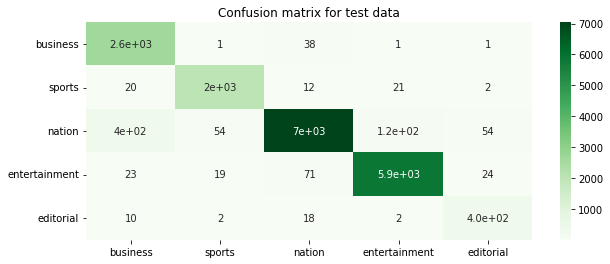

In [ ]:
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score,average_precision_score,f1_score
confusion_mat = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(10,4))
plt.title("Confusion matrix for test data")
plt.xlabel("Predicted class")
plt.ylabel("True class")
sns.heatmap(confusion_mat, annot=True, cmap="Greens",  xticklabels = target_names,
           yticklabels=target_names)
plt.show()

In [ ]:
# Function for predicting a sample text with the trained model
def predict_text_sample(test_text, inv_topic_dict, clf, count_vec):
  test_sample = [test_text]
  x_test_sample_fetaures = count_vec.transform(test_sample)
  y_pred_test_sample = clf.predict(x_test_sample_fetaures)
  return inv_topic_dict[y_pred_test_sample[0]]

In [ ]:
!pip install deep_translator

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 128 kB 40.8 MB/s 
  Attempting uninstall: beautifulsoup4
    Found existing installation: beautifulsoup4 4.6.3
    Uninstalling beautifulsoup4-4.6.3:
      Successfully uninstalled beautifulsoup4-4.6.3


In [ ]:
# This sample text is about some sports news from a telugu news website (Eenadu)
test_text = "టీ20 ప్రప్రంచకప్‌లో టీమ్‌ఇండియా ఆడటానికి ముందు న్యూజిలాండ్‌తో వార్మప్‌ మ్యాచ్‌ జరగాల్సి ఉంది. అయితే వర్షం కారణంగా రద్దైంది. ఆ తర్వాత పాకిస్థాన్‌తో మెల్‌బోర్న్‌ వేదికగా\
 మ్యాచ్‌కు వరుణుడి గండం ఉందని వార్తలు వచ్చాయి. దీంతో సోషల్‌ మీడియాలో మీమ్స్‌ కూడా భారీ స్థాయిలో ట్రోల్‌ అయ్యాయి. అయితే వాతావరణం అనుకూలంగా మారడంతో దాయాదుల పోరును\
  అక్టోబర్‌ 23న వీక్షించే అవకాశం అభిమానులకు దక్కింది. ఉత్కంఠపోరులో టీమ్‌ఇండియా విజయం సాధించిన విషయం తెలిసిందే. "
from deep_translator import GoogleTranslator
translated = GoogleTranslator(source='te', target='en').translate(test_text)
print("Prediced class is " , predict_text_sample(translated, inv_topic_dict, clf, count_vec))

Prediced class is  sports
